# **Import**

In [831]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import root_mean_squared_error, r2_score, mean_absolute_error

# **Import dataset**

In [832]:
df = pd.read_csv("salaries.csv")

In [833]:
df.head()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2025,EX,FT,Head of Data,348516,USD,348516,US,0,US,M
1,2025,EX,FT,Head of Data,232344,USD,232344,US,0,US,M
2,2025,SE,FT,Data Scientist,145400,USD,145400,US,0,US,M
3,2025,SE,FT,Data Scientist,81600,USD,81600,US,0,US,M
4,2025,MI,FT,Engineer,160000,USD,160000,US,100,US,M


0 : no remote work, 
50 : Hybrid, 
100 : Full remote

# **Dataset analysis**

In [834]:
# Dimensions
df.shape

(151445, 11)

In [835]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 151445 entries, 0 to 151444
Data columns (total 11 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   work_year           151445 non-null  int64 
 1   experience_level    151445 non-null  object
 2   employment_type     151445 non-null  object
 3   job_title           151445 non-null  object
 4   salary              151445 non-null  int64 
 5   salary_currency     151445 non-null  object
 6   salary_in_usd       151445 non-null  int64 
 7   employee_residence  151445 non-null  object
 8   remote_ratio        151445 non-null  int64 
 9   company_location    151445 non-null  object
 10  company_size        151445 non-null  object
dtypes: int64(4), object(7)
memory usage: 12.7+ MB


In [836]:
# Name and types of columns
df.dtypes

work_year              int64
experience_level      object
employment_type       object
job_title             object
salary                 int64
salary_currency       object
salary_in_usd          int64
employee_residence    object
remote_ratio           int64
company_location      object
company_size          object
dtype: object

In [837]:
# Missing values
df.isnull().sum()

work_year             0
experience_level      0
employment_type       0
job_title             0
salary                0
salary_currency       0
salary_in_usd         0
employee_residence    0
remote_ratio          0
company_location      0
company_size          0
dtype: int64

In [ ]:
# Statistics
df.describe()

,work_year,salary,salary_in_usd,remote_ratio
count,151445.000000,1.514450e+05,151445.000000,151445.000000
mean,2024.435313,1.628380e+05,157527.458411,20.938625
std,0.671842,2.080124e+05,74150.772377,40.620393
min,2020.000000,1.400000e+04,15000.000000,0.000000
25%,2024.000000,1.060000e+05,105800.000000,0.000000
50%,2025.000000,1.470000e+05,146100.000000,0.000000
75%,2025.000000,1.990000e+05,198000.000000,0.000000
max,2025.000000,3.040000e+07,800000.000000,100.000000


In [ ]:
# Column names
df.columns

Index(['work_year', 'experience_level', 'employment_type', 'job_title',
       'salary', 'salary_currency', 'salary_in_usd', 'employee_residence',
       'remote_ratio', 'company_location', 'company_size'],
      dtype='object')

In [840]:
df.nunique()

work_year                 6
experience_level          4
employment_type           4
job_title               422
salary                12308
salary_currency          26
salary_in_usd         13580
employee_residence      104
remote_ratio              3
company_location         97
company_size              3
dtype: int64

In [841]:
df["employee_residence"].unique()

array(['US', 'CA', 'NL', 'FR', 'GB', 'DE', 'ES', 'IE', 'AU', 'LT', 'IN',
       'EE', 'SK', 'CZ', 'UA', 'FI', 'CO', 'AR', 'AT', 'EG', 'SG', 'MX',
       'IT', 'PL', 'BE', 'CH', 'GR', 'NZ', 'HR', 'PR', 'PT', 'BR', 'PH',
       'RO', 'ML', 'NO', 'CL', 'MY', 'SV', 'DO', 'GT', 'CR', 'LV', 'ZA',
       'JO', 'CY', 'TH', 'JM', 'JP', 'MT', 'MK', 'SI', 'HK', 'LS', 'ID',
       'PE', 'HU', 'PA', 'LU', 'DZ', 'KE', 'CD', 'SE', 'KR', 'TW', 'TR',
       'NG', 'DK', 'AE', 'BG', 'RS', 'EC', 'XK', 'ZM', 'AM', 'RW', 'IL',
       'LB', 'PK', 'HN', 'VE', 'BM', 'VN', 'GE', 'SA', 'OM', 'BA', 'UG',
       'MU', 'QA', 'RU', 'TN', 'GH', 'AD', 'MD', 'UZ', 'CF', 'KW', 'IR',
       'AS', 'CN', 'BO', 'IQ', 'JE'], dtype=object)

In [842]:
df["company_location"].unique()

array(['US', 'CA', 'NL', 'FR', 'GB', 'DE', 'ES', 'IE', 'AU', 'LT', 'IN',
       'EE', 'SK', 'CZ', 'UA', 'FI', 'CO', 'AR', 'AT', 'EG', 'SG', 'MX',
       'IT', 'PL', 'BE', 'CH', 'GR', 'NZ', 'HR', 'PR', 'PT', 'BR', 'PH',
       'RO', 'ML', 'NO', 'CL', 'MY', 'SV', 'DO', 'GT', 'CR', 'LV', 'ZA',
       'JO', 'CY', 'TH', 'JM', 'JP', 'MT', 'MK', 'SI', 'HK', 'LS', 'PE',
       'HU', 'PA', 'LU', 'DZ', 'KE', 'CD', 'SE', 'KR', 'TW', 'TR', 'DK',
       'AE', 'BG', 'ID', 'RS', 'EC', 'XK', 'ZM', 'AM', 'IL', 'LB', 'NG',
       'PK', 'HN', 'VE', 'AS', 'SA', 'OM', 'BA', 'VN', 'GI', 'MU', 'RU',
       'QA', 'GH', 'AD', 'CF', 'IR', 'BS', 'IQ', 'CN', 'MD'], dtype=object)

In [843]:
import pycountry

def iso2_to_country(iso):
    try:
        return pycountry.countries.get(alpha_2=iso).name
    except:
        return None


In [844]:
df["employee_residence"] = df["employee_residence"].apply(iso2_to_country)
df["company_location"] = df["company_location"].apply(iso2_to_country)


In [845]:
df["company_location"].unique()


array(['United States', 'Canada', 'Netherlands', 'France',
       'United Kingdom', 'Germany', 'Spain', 'Ireland', 'Australia',
       'Lithuania', 'India', 'Estonia', 'Slovakia', 'Czechia', 'Ukraine',
       'Finland', 'Colombia', 'Argentina', 'Austria', 'Egypt',
       'Singapore', 'Mexico', 'Italy', 'Poland', 'Belgium', 'Switzerland',
       'Greece', 'New Zealand', 'Croatia', 'Puerto Rico', 'Portugal',
       'Brazil', 'Philippines', 'Romania', 'Mali', 'Norway', 'Chile',
       'Malaysia', 'El Salvador', 'Dominican Republic', 'Guatemala',
       'Costa Rica', 'Latvia', 'South Africa', 'Jordan', 'Cyprus',
       'Thailand', 'Jamaica', 'Japan', 'Malta', 'North Macedonia',
       'Slovenia', 'Hong Kong', 'Lesotho', 'Peru', 'Hungary', 'Panama',
       'Luxembourg', 'Algeria', 'Kenya',
       'Congo, The Democratic Republic of the', 'Sweden',
       'Korea, Republic of', 'Taiwan, Province of China', 'Türkiye',
       'Denmark', 'United Arab Emirates', 'Bulgaria', 'Indonesia',
       'Se

In [846]:
df['company_size'].unique()

array(['M', 'L', 'S'], dtype=object)

In [847]:
df.replace({

    'remote_ratio': {
        0: 'On-site',
        50: 'Hybrid',
        100: 'Remote'
    },

    'experience_level': {
        'EN': 'Entry-level / Junior',
        'MI': 'Mid-level / Intermediate',
        'SE': 'Senior-level',
        'EX': 'Executive / Director'
    },

    'company_size' : {
        'S' : 'Small', 
        'M' : 'Meduim',
        'L' : 'Large'
    }


}, inplace=True)

In [848]:
df.head()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2025,Executive / Director,FT,Head of Data,348516,USD,348516,United States,On-site,United States,Meduim
1,2025,Executive / Director,FT,Head of Data,232344,USD,232344,United States,On-site,United States,Meduim
2,2025,Senior-level,FT,Data Scientist,145400,USD,145400,United States,On-site,United States,Meduim
3,2025,Senior-level,FT,Data Scientist,81600,USD,81600,United States,On-site,United States,Meduim
4,2025,Mid-level / Intermediate,FT,Engineer,160000,USD,160000,United States,Remote,United States,Meduim


# **Visualization**

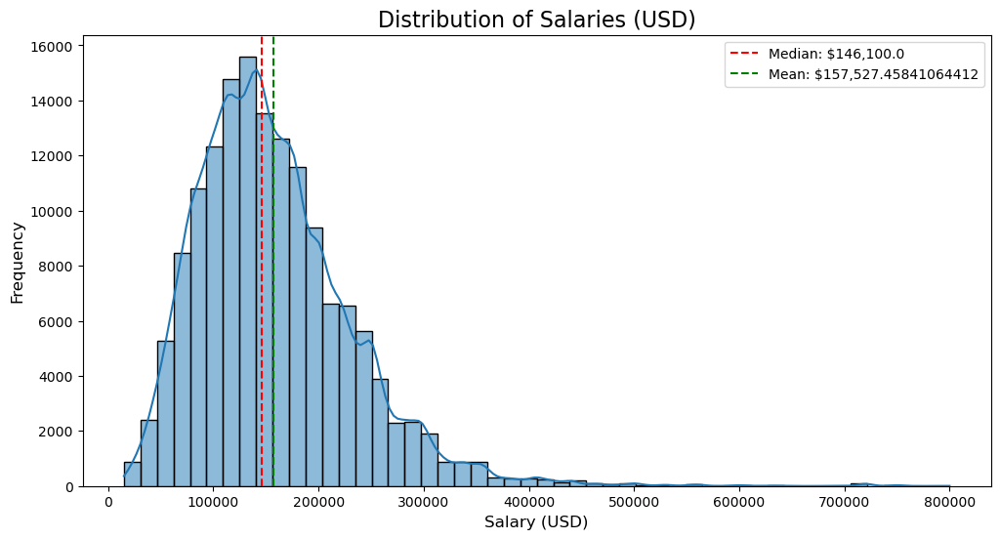

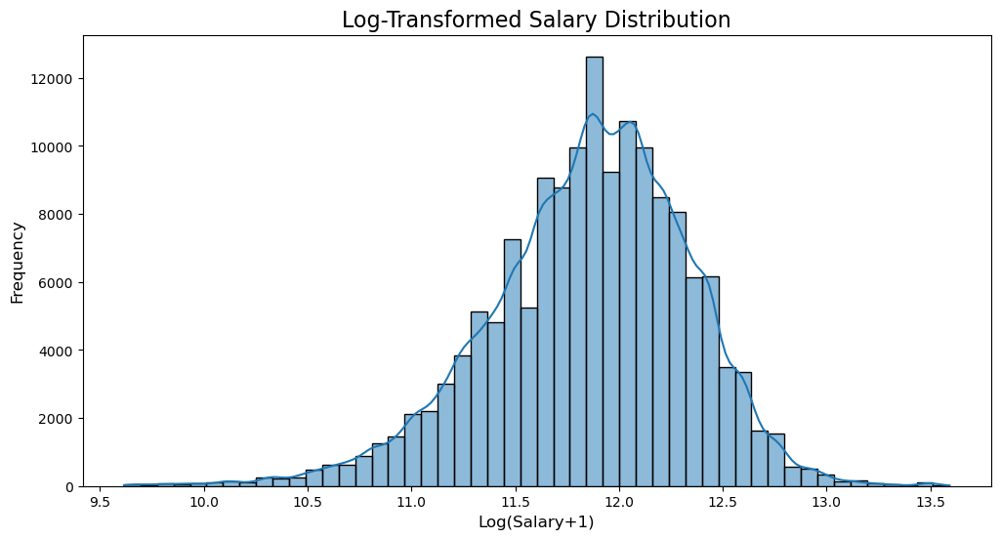

In [849]:
plt.figure(figsize=(12, 6))
sns.histplot(df['salary_in_usd'], kde=True, bins=50)
plt.title('Distribution of Salaries (USD)', fontsize=16)
plt.xlabel('Salary (USD)', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.axvline(df['salary_in_usd'].median(), color='red', linestyle='--', label=f'Median: ${df["salary_in_usd"].median():,}')
plt.axvline(df['salary_in_usd'].mean(), color='green', linestyle='--', label=f'Mean: ${df["salary_in_usd"].mean():,}')
plt.legend()
plt.show()

# Log-transformed salary distribution (to handle skewness)
plt.figure(figsize=(12, 6))
sns.histplot(np.log1p(df['salary_in_usd']), kde=True, bins=50)
plt.title('Log-Transformed Salary Distribution', fontsize=16)
plt.xlabel('Log(Salary+1)', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.show()

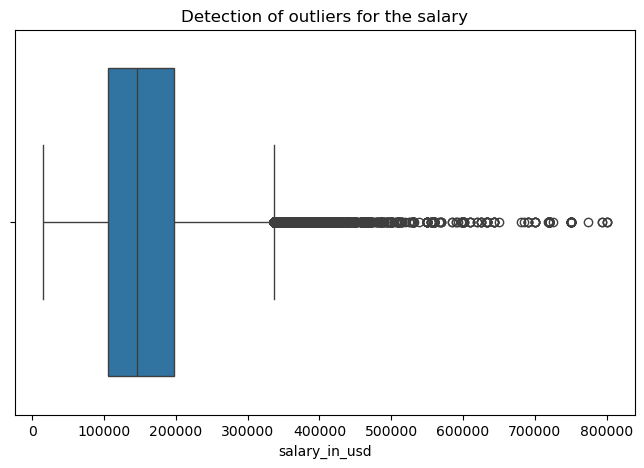

In [850]:
plt.figure(figsize=(8, 5))
sns.boxplot(x=df['salary_in_usd'])
plt.title("Detection of outliers for the salary")
plt.show()

In [851]:
import plotly.express as px
import plotly.graph_objects as go
# Yearly salary trends
yearly_stats = df.groupby('work_year')['salary_in_usd'].agg(['mean', 'median', 'std']).reset_index()

fig = px.line(yearly_stats, x='work_year', y=['mean', 'median'], 
              title='Data Science Salary Trends (2020-2025)',
              labels={'value': 'Salary (USD)', 'work_year': 'Year', 'variable': 'Metric'},
              template='plotly_white')

fig.update_layout(legend_title_text='', hovermode='x unified',
                 width=900, height=500)

# Add range for standard deviation
fig.add_trace(go.Scatter(
    x=np.concatenate([yearly_stats['work_year'], yearly_stats['work_year'][::-1]]),
    y=np.concatenate([yearly_stats['mean'] + yearly_stats['std'], 
                     (yearly_stats['mean'] - yearly_stats['std'])[::-1]]),
    fill='toself',
    fillcolor='rgba(0,100,80,0.2)',
    line=dict(color='rgba(255,255,255,0)'),
    name='Standard Deviation'
))

fig.show()

From this graph, we can observe a clear upward trend in data science salaries between 2020 and 2025.
The most significant increase occurs between 2021 and 2022, followed by continuous growth through 2023 and 2024.

Several industry dynamics can explain this acceleration:

- The rapid expansion of artificial intelligence and machine learning, which created a strong demand for skilled profiles.

- The post-pandemic digital transformation, which pushed companies to invest massively in data, analytics, and automation.

- The emergence of new AI technologies, which increased the value and scarcity of experienced talent.

In 2025, salaries stabilize slightly, suggesting a market that is still growing but becoming more structured after several years of intense acceleration.

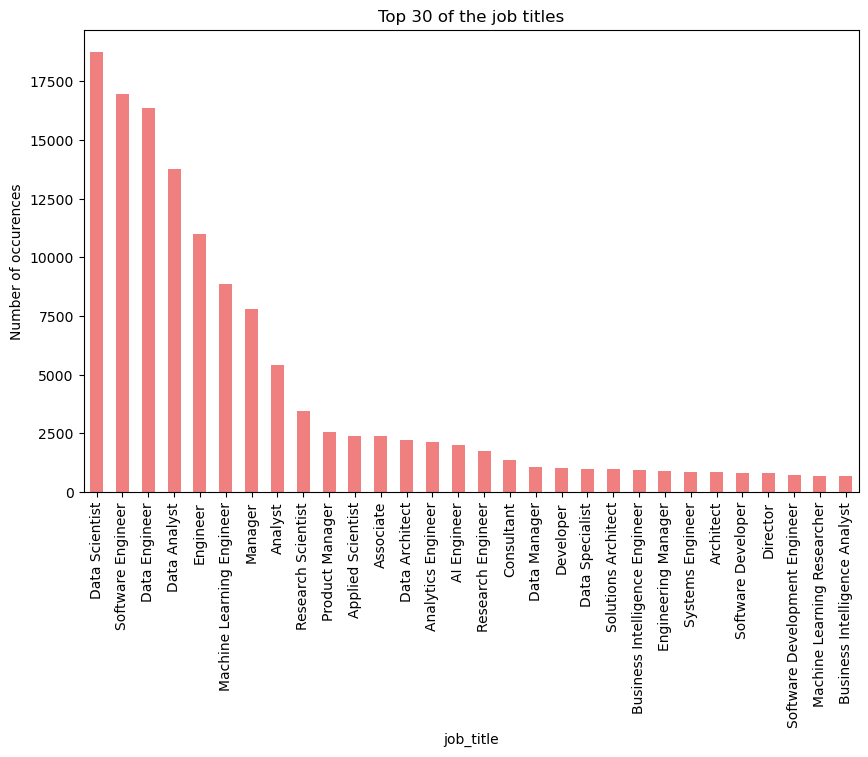

In [852]:
plt.figure(figsize=(10, 6))
df['job_title'].value_counts().head(30).plot(kind='bar', color='lightcoral')
plt.title("Top 30 of the job titles")
plt.ylabel("Number of occurences")
plt.show()

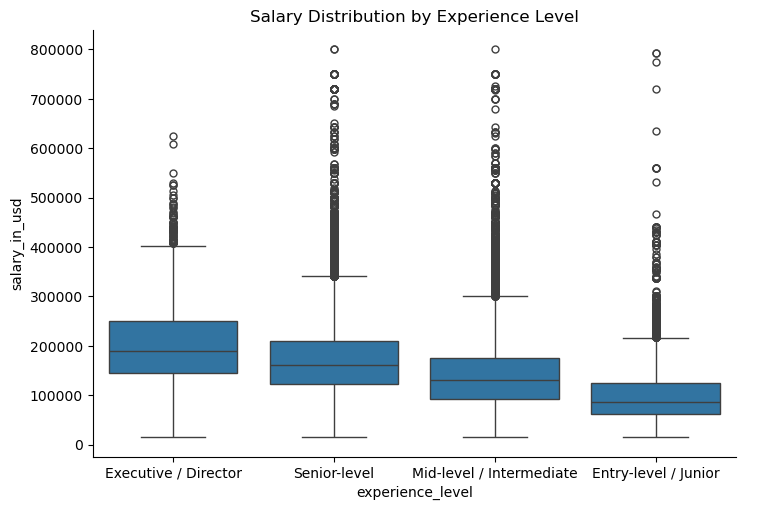

In [853]:
sns.catplot(data=df, x="experience_level", y="salary_in_usd", kind="box", height=5, aspect=1.5)
plt.title("Salary Distribution by Experience Level")
plt.show()

C:\Users\picar\AppData\Local\Temp\ipykernel_10132\567234624.py:39: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




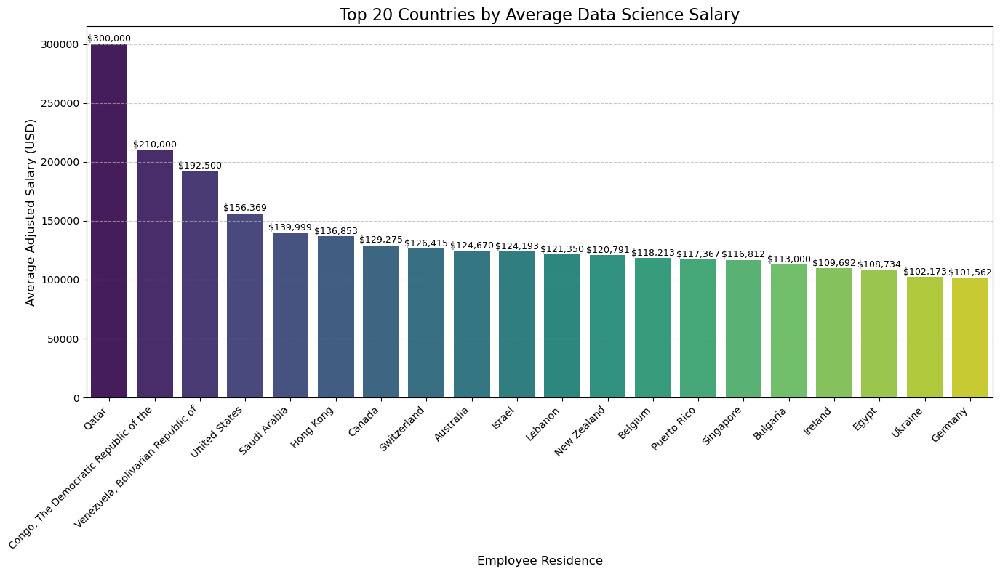

In [884]:
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt

# 1) Salaire moyen par pays (résidence employé)
avg_salary_by_residence = (
    df.groupby('company_location')['salary_in_usd']
      .mean()
      .reset_index()
)

# on renomme pour être clair et compatible avec plotly
avg_salary_by_residence = avg_salary_by_residence.rename(
    columns={'company_location': 'country_name'}
)

# 2) Carte choroplèthe
fig2 = px.choropleth(
    avg_salary_by_residence,
    locations='country_name',            # déjà des noms de pays
    locationmode='country names',
    color='salary_in_usd',
    hover_name='country_name',
    hover_data={'salary_in_usd': ':,.0f'},
    color_continuous_scale=px.colors.sequential.Plasma,
    title='Average Salary by Employee Residence',
    labels={'salary_in_usd': 'Average Adjusted Salary'},
    projection='natural earth'
)
fig2.update_layout(width=1000, height=600)
fig2.show()

# 3) Top 20 pays en barplot
top_countries = avg_salary_by_residence.sort_values(
    'salary_in_usd', ascending=False
).head(20)

plt.figure(figsize=(14, 8))
chart = sns.barplot(
    x='country_name',
    y='salary_in_usd',
    data=top_countries,
    palette='viridis',
    order=top_countries['country_name']
)
plt.title('Top 20 Countries by Average Data Science Salary', fontsize=16)
plt.xlabel('Employee Residence', fontsize=12)
plt.ylabel('Average Adjusted Salary (USD)', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Valeurs au-dessus des barres
for i, bar in enumerate(chart.patches):
    chart.text(
        bar.get_x() + bar.get_width() / 2.,
        bar.get_height() + 2000,
        f'${top_countries["salary_in_usd"].iloc[i]:,.0f}',
        ha='center',
        fontsize=9
    )

plt.tight_layout()
plt.show()


This choropleth map highlights strong geographical disparities in salaries.
North America (United States, Canada) shows the highest average salaries, followed by Western Europe and Australia.
Eastern Europe and South America display lower compensation levels.
This confirms that salary strongly depends on the country of residence and justifies including employee_residence and company_location as important predictive features in the model.

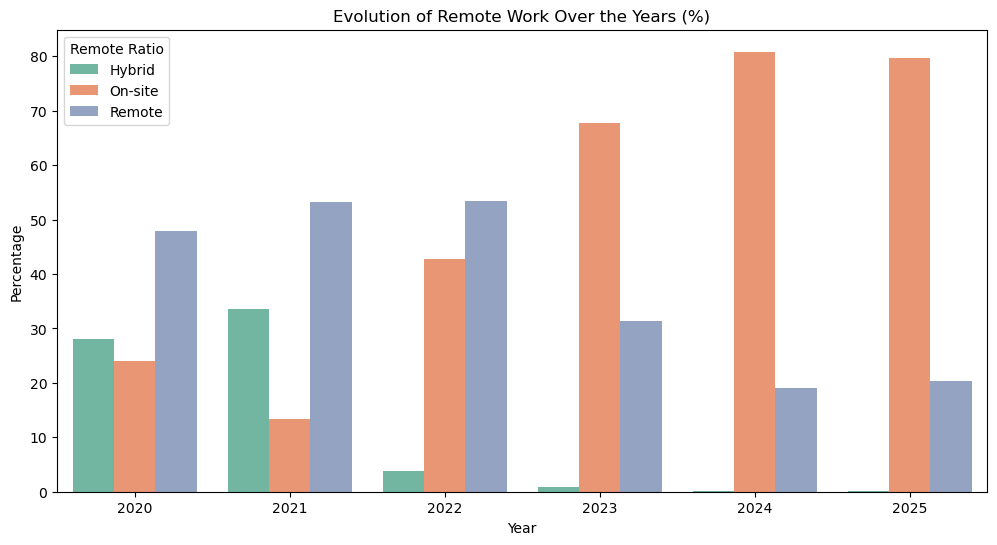

In [855]:


# Calculer la distribution remote_ratio par année
remote_year = (
    df.groupby(['work_year', 'remote_ratio'])
      .size()
      .reset_index(name='count')
)

# Normaliser en pourcentage
remote_year['percent'] = remote_year.groupby('work_year')['count'].transform(lambda x: x / x.sum() * 100)

plt.figure(figsize=(12,6))
sns.barplot(
    data=remote_year,
    x="work_year",
    y="percent",
    hue="remote_ratio",
    palette="Set2"
)

plt.title("Evolution of Remote Work Over the Years (%)")
plt.ylabel("Percentage")
plt.xlabel("Year")
plt.legend(title="Remote Ratio")
plt.show()


This barplot clearly highlights the evolution of work modes over the years and reveals a strong shift toward on-site work.

Between 2020 and 2022, the distribution between remote, hybrid, and on-site work reflects the strong influence of the Covid-19 pandemic and the lockdown periods. During these years, remote and hybrid arrangements remain widely adopted as companies adapt to health restrictions and the sudden need for operational continuity outside traditional offices.

However, starting in 2023, once the effects of the pandemic fade and most restrictions are lifted, we observe a sharp resurgence of on-site work. This return intensifies in 2024 and 2025, where on-site work becomes overwhelmingly dominant, while remote work declines significantly and hybrid work almost disappears. This suggests that many companies progressively reverted to pre-pandemic habits, reinstating physical presence as the standard mode of operation. However, we still observe that around 20% of workers remain fully remote, a proportion that is likely a long-term consequence of the pandemic. It would have been particularly interesting to have data from before the lockdown period to quantify how much the pandemic transformed working habits and to compare the pre- and post-Covid distribution.

C:\Users\picar\AppData\Local\Temp\ipykernel_10132\716565256.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




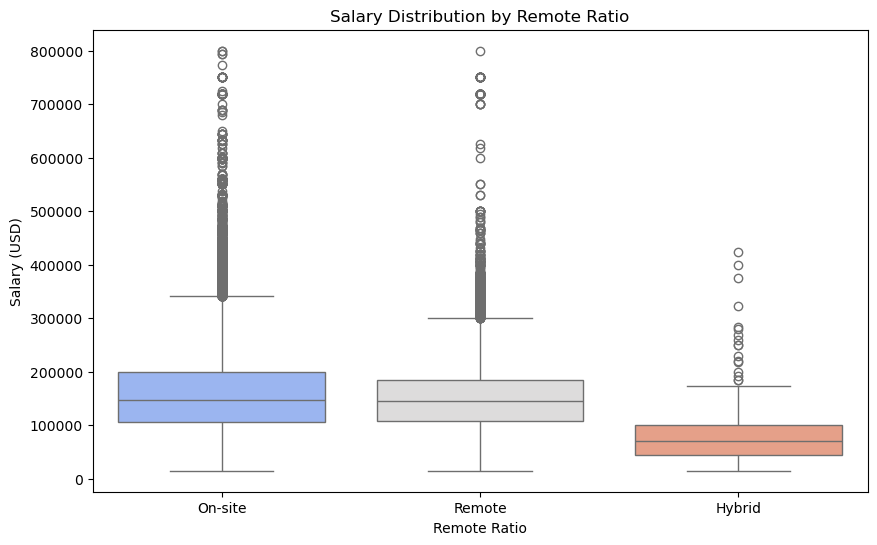

In [856]:
plt.figure(figsize=(10,6))
sns.boxplot(
    data=df,
    x="remote_ratio",
    y="salary_in_usd",
    palette="coolwarm"
)

plt.title("Salary Distribution by Remote Ratio")
plt.xlabel("Remote Ratio")
plt.ylabel("Salary (USD)")
plt.show()


These boxplots show that salary levels differ depending on the remote ratio. On-site and fully remote employees display similar salary distributions, while hybrid workers earn noticeably less. This lower salary level is likely explained by the fact that hybrid workers are almost entirely absent from the dataset after 2023, a period during which salaries increased significantly as observed in the graphs ealier. As a result, hybrid workers do not benefit from the recent salary growth, which naturally lowers their overall median salary compared to the two other groups.

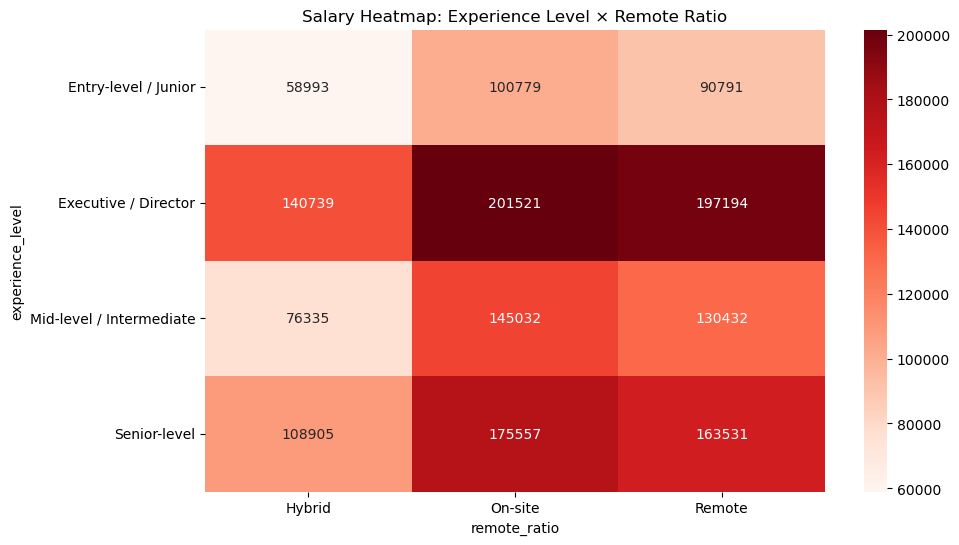

In [857]:
pivot_remote_exp = df.pivot_table(
    values="salary_in_usd",
    index="experience_level",
    columns="remote_ratio",
    aggfunc="mean"
)

plt.figure(figsize=(10,6))
sns.heatmap(pivot_remote_exp, cmap="Reds", annot=True, fmt=".0f")
plt.title("Salary Heatmap: Experience Level × Remote Ratio")
plt.show()


In [858]:
df_diff = df[df["employee_residence"] != df["company_location"]]
countries_with_non_local_employees = df_diff["company_location"].unique()
countries_with_non_local_employees
df_diff[["employee_residence", "company_location"]]
non_local_counts = df_diff["company_location"].value_counts()
non_local_counts



company_location
United States                            70
Germany                                  15
United Kingdom                           10
Australia                                 7
Canada                                    6
France                                    4
American Samoa                            4
Poland                                    3
Russian Federation                        3
Spain                                     2
Czechia                                   2
Netherlands                               2
Luxembourg                                2
Denmark                                   2
Israel                                    2
Italy                                     1
Hungary                                   1
Greece                                    1
Ukraine                                   1
Gibraltar                                 1
Congo, The Democratic Republic of the     1
Algeria                                   1
Sweden         

In [859]:
print((df['company_location'] != df['employee_residence']).sum()
)

159


C:\Users\picar\AppData\Local\Temp\ipykernel_10132\2135541349.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




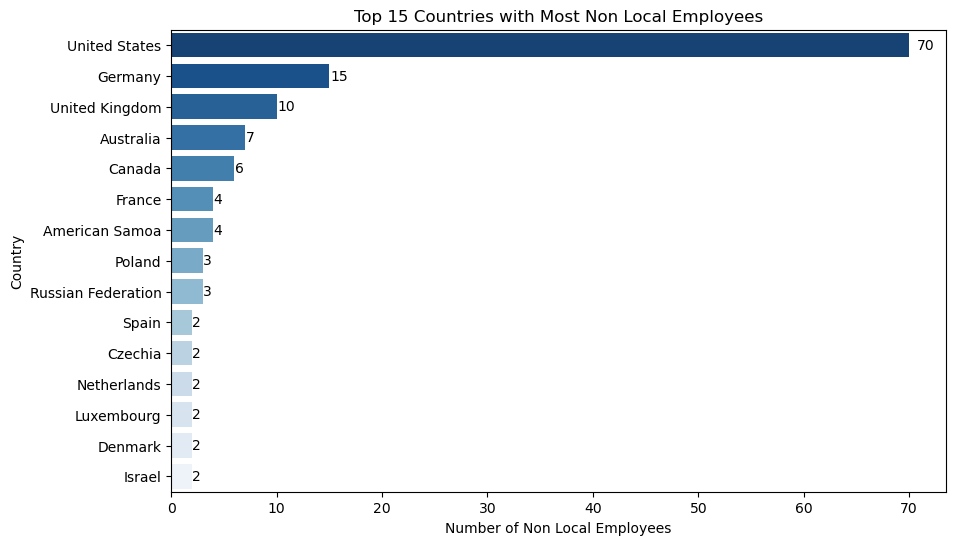

In [860]:
top_non_local = non_local_counts.head(15)

plt.figure(figsize=(10,6))
ax = sns.barplot(
    x=top_non_local.values, 
    y=top_non_local.index, 
    palette="Blues_r"
)

plt.title("Top 15 Countries with Most Non Local Employees")
plt.xlabel("Number of Non Local Employees")
plt.ylabel("Country")

# Ajouter les valeurs à droite des barres
for i, v in enumerate(top_non_local.values):
    ax.text(
        v + (v * 0.01),      # position X légèrement à droite
        i,                   # position Y
        f"{v:,}",            # format joli : 12,345
        color="black",
        va="center",
        fontsize=10
    )

plt.show()


In [861]:
df_same = df[df["employee_residence"] == df["company_location"]]
countries_with_local_employees = df_same["company_location"].unique()
local_counts = df_same["company_location"].value_counts()
local_counts


company_location
United States                135499
Canada                         6202
United Kingdom                 4171
Australia                       588
Netherlands                     480
                              ...  
Qatar                             1
Andorra                           1
Iran, Islamic Republic of         1
Iraq                              1
Moldova, Republic of              1
Name: count, Length: 92, dtype: int64

C:\Users\picar\AppData\Local\Temp\ipykernel_10132\1653475029.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




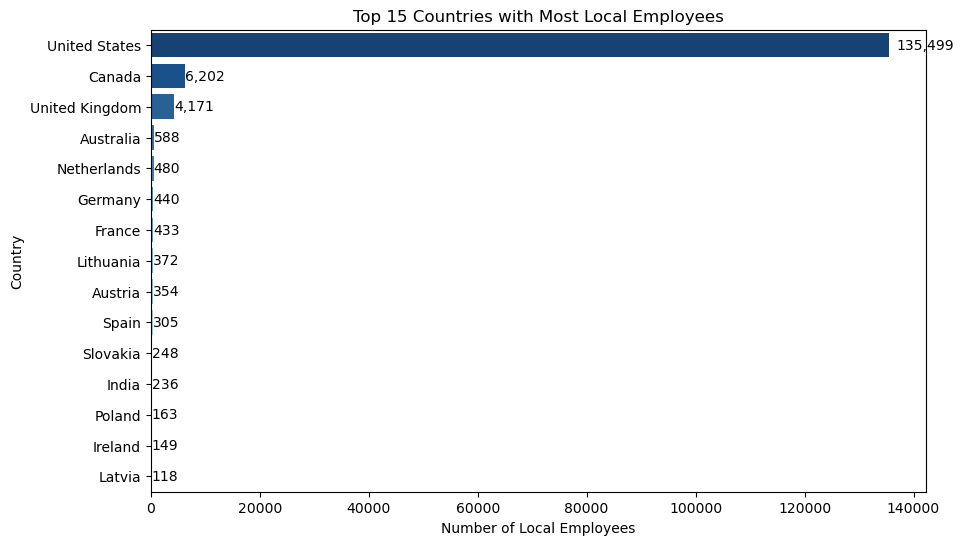

In [862]:
top_local = local_counts.head(15)

plt.figure(figsize=(10,6))
ax = sns.barplot(
    x=top_local.values, 
    y=top_local.index, 
    palette="Blues_r"
)

plt.title("Top 15 Countries with Most Local Employees")
plt.xlabel("Number of Local Employees")
plt.ylabel("Country")

# Ajouter les valeurs à droite des barres
for i, v in enumerate(top_local.values):
    ax.text(
        v + (v * 0.01),      # position X légèrement à droite
        i,                   # position Y
        f"{v:,}",            # format joli : 12,345
        color="black",
        va="center",
        fontsize=10
    )

plt.show()



In [863]:
# Salary by company size
company_salary = df.groupby(['company_size', 'experience_level'])['salary_in_usd'].median().reset_index()


fig = px.bar(company_salary, x='company_size', y='salary_in_usd', color='experience_level',
            barmode='group', title='Median Salary by Company Size and Experience Level',
            labels={'salary_in_usd': 'Median Salary (USD)', 'company_size': 'Company Size'},
            template='plotly_white')

fig.update_layout(width=900, height=500)
fig.show()

This chart highlights two important insights about how salary varies with both experience level and company size.

First, experience remains a strong driver of compensation, but not always in a strictly linear way. In large companies, Senior-level employees actually earn a slightly higher median salary than Executive/Director-level employees, suggesting that senior technical or specialist roles may be valued more highly than upper management positions. In medium and small companies, however, Executive/Director roles remain the highest paid.

Second, company size also influences salary patterns. Medium-sized companies offer the highest median salary for executives, while large companies tend to pay more for senior profiles. Small companies consistently offer the lowest median salaries across all experience levels.

Overall, the graph shows that salary dynamics depend on both company size and experience, but the relationship is not strictly hierarchical: the highest experience level does not always correspond to the highest pay, especially in large companies.

In [864]:
fig = px.box(
    df,
    x='company_size',
    y='salary_in_usd',
    color='experience_level',
    title='Salary Inequality by Company Size and Experience Level',
    labels={'salary_in_usd': 'Salary (USD)', 'company_size': 'Company Size'},
    template='plotly_white'
)

fig.update_layout(width=900, height=500)
fig.show()


This chart reveals strong inequalities in salary distribution across both company size and experience level. While experience generally increases compensation, the spread of salaries within each category varies widely. Medium-sized companies show the highest level of inequality, with very large salary ranges and numerous outliers, particularly for senior and executive profiles. Large companies display similar patterns but with a slightly more contained variance, whereas small companies have the most homogeneous and compressed salary distributions.

Experience does not always translate into a strictly linear hierarchy of pay. In large companies, for example, Senior-level employees sometimes earn more than Executives/Directors, suggesting that highly specialized or technical roles may be valued above managerial positions. In medium-sized companies, Executive/Director roles remain the highest paid on average, while small companies consistently offer lower and less variable salaries across all experience levels.

Overall, the boxplot highlights that salary dynamics are shaped not only by experience, but also by the size of the company and the level of inequality within each group. Medium companies exhibit the greatest internal disparities, large companies show moderate inequality, and small companies remain the most uniform in their salary structure.

In [865]:
company_counts = df['company_size'].value_counts().rename_axis('company_size').reset_index(name='count')
fig = px.bar(
    company_counts,
    x='company_size',
    y='count',
    text='count',
    title='Number of Companies by Size',
    labels={'company_size': 'Company Size', 'count': 'Number of Companies'},
    template='plotly_white'
)

fig.update_traces(textposition='outside')
fig.update_layout(width=800, height=500)
fig.show()

 This barplot reveals a very strong imbalance in the distribution of company sizes within the dataset. Medium-sized companies are overwhelmingly dominant, representing the vast majority of observations. Large companies are present but in much smaller proportions, while small companies are extremely underrepresented.

Such a distribution is important to acknowledge because it directly affects the reliability of subsequent salary comparisons. Insights derived from Medium companies are statistically robust due to their large representation, while those based on Large companies remain acceptable but more limited. However, conclusions regarding Small companies should be interpreted with caution given their very small sample size.

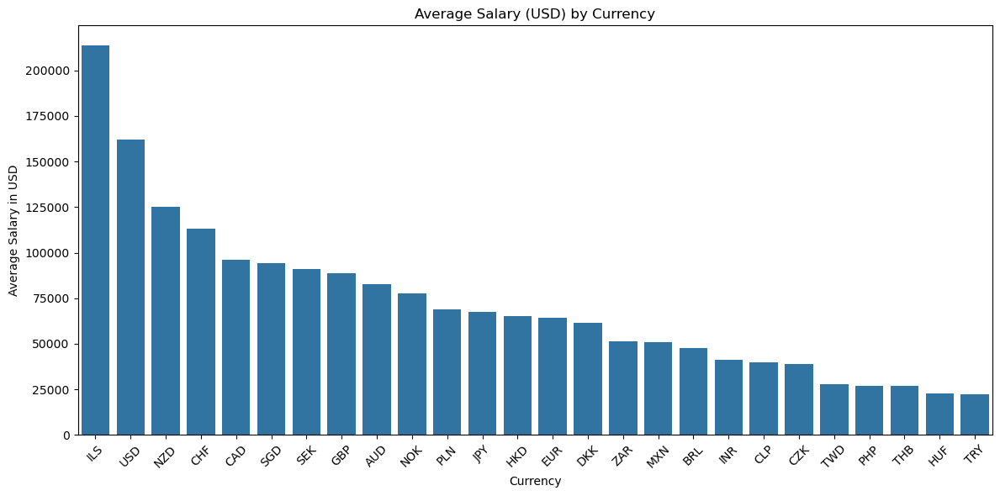

In [866]:
# Calcul de la moyenne par devise
avg_salary_by_currency = df.groupby('salary_currency')['salary_in_usd'].mean().reset_index()

# Tri pour améliorer la lisibilité
avg_salary_by_currency = avg_salary_by_currency.sort_values(by='salary_in_usd', ascending=False)

# Plot
plt.figure(figsize=(12,6))
sns.barplot(data=avg_salary_by_currency, x='salary_currency', y='salary_in_usd')

plt.title('Average Salary (USD) by Currency')
plt.xlabel('Currency')
plt.ylabel('Average Salary in USD')

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


# **Duplicates**

In [867]:
df.duplicated().any()

np.True_

In [868]:
num_duplicates = df.duplicated().sum()
num_duplicates

np.int64(79532)

In [869]:
df = df.drop_duplicates()

In [870]:
df.shape

(71913, 11)

# **Outliers**

In [871]:
from scipy import stats

z_scores = stats.zscore(df['salary_in_usd'])

df = df[abs(z_scores) < 3]  

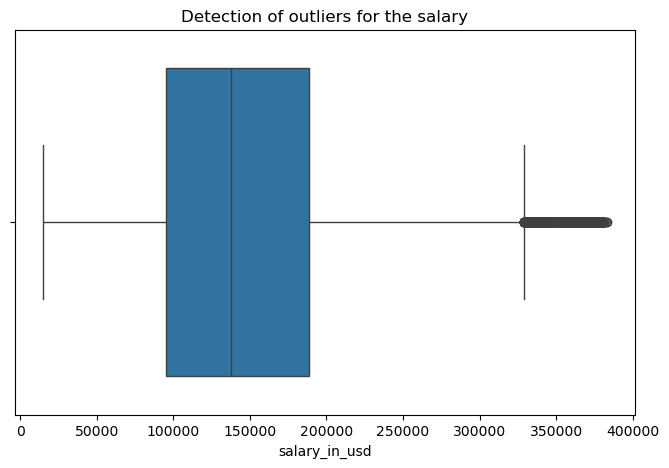

In [872]:
plt.figure(figsize=(8, 5))
sns.boxplot(x=df['salary_in_usd'])
plt.title("Detection of outliers for the salary")
plt.show()

In [881]:
fig = px.box(
    df,
    x='company_size',
    y='salary_in_usd',
    color='experience_level',
    title='Salary Inequality by Company Size and Experience Level',
    labels={'salary_in_usd': 'Salary (USD)', 'company_size': 'Company Size'},
    template='plotly_white'
)

fig.update_layout(width=900, height=500)
fig.show()


# **Feature Engineering** 

In [ ]:
(df['company_location'] == df['employee_residence']).mean() * 100


np.float64(99.77779652912552)

In [ ]:

df = df[df['company_location'] == df['employee_residence']]

df['country'] = df['company_location']

df = df.drop(columns=['company_location', 'employee_residence'])



After the graph representing the numbers of non local employees, as said before there was a negligeable amount of people not living in the same country as compagny location, therefor we computed the correlation between 'company_location' and 'employee_residence'. The result is 99.895%, so we decided to created a new column, named 'country' where we keep the countries that 

In [ ]:
coutry_counts = df['country'].value_counts() 
rare_countries = coutry_counts[coutry_counts < 200].index

df['country'] = df['country'].replace(rare_countries, 'Other')
df['country'].value_counts()

country
United States     59338
Canada             4553
United Kingdom     2782
Other              1957
Australia           501
Netherlands         395
Germany             385
Lithuania           312
France              298
Spain               221
India               206
Name: count, dtype: int64

Also as said before, we realised that there was over 103 countries represented in this dataset, but most of them are not represented so you decided to created a category 'other' where we store all the countries where there is less then 200 hundred person. 

In [ ]:
df = df.drop(columns = 'salary')

It is important to remove salary from the dataset because it is represent a possible dataleak for the furtur predictions 

# **Encoding**

In [ ]:
df['experience_level'] = df['experience_level'].map({
    'Entry-level / Junior': 1,  # Entry-level / Junior
    'Mid-level / Intermediate': 2,  # Mid-level / Intermediate
    'Senior-level': 3,  # Senior-level
    'Executive / Director': 4   # Executive / Director
})



In [ ]:
df.head()

,work_year,experience_level,employment_type,job_title,salary_currency,salary_in_usd,remote_ratio,company_size,country
0,2025,4,FT,Head of Data,USD,348516,On-site,Meduim,United States
1,2025,4,FT,Head of Data,USD,232344,On-site,Meduim,United States
2,2025,3,FT,Data Scientist,USD,145400,On-site,Meduim,United States
3,2025,3,FT,Data Scientist,USD,81600,On-site,Meduim,United States
4,2025,2,FT,Engineer,USD,160000,Remote,Meduim,United States


In [ ]:
df['company_size'] = df['company_size'].map({
    'Small': 1,  # Small (1–50 employees)
    'Meduim': 2,  # Medium (51–500 employees)
    'Large': 3   # Large (501+ employees)
})

In [ ]:
df.head()

,work_year,experience_level,employment_type,job_title,salary_currency,salary_in_usd,remote_ratio,company_size,country
0,2025,4,FT,Head of Data,USD,348516,On-site,2,United States
1,2025,4,FT,Head of Data,USD,232344,On-site,2,United States
2,2025,3,FT,Data Scientist,USD,145400,On-site,2,United States
3,2025,3,FT,Data Scientist,USD,81600,On-site,2,United States
4,2025,2,FT,Engineer,USD,160000,Remote,2,United States


In [ ]:
job_counts = df['job_title'].value_counts().reset_index()
job_counts.columns = ['job_title', 'count']

rare_jobs = job_counts[job_counts['count'] < 10]
print(rare_jobs)

                            job_title  count
225       Data Visualization Designer      9
226         Data Integrity Specialist      9
227                        Copywriter      9
228                   AI Product Lead      9
229                     Web Developer      9
..                                ...    ...
412               People Data Analyst      1
413  AI Software Development Engineer      1
414                  Lead AI Engineer      1
415                  CRM Data Analyst      1
416     Quantitative Research Analyst      1

[192 rows x 2 columns]


In [ ]:
top_jobs = (df['job_title'].value_counts().head(15).index.tolist())
top_jobs

['Data Scientist',
 'Data Engineer',
 'Data Analyst',
 'Software Engineer',
 'Engineer',
 'Manager',
 'Machine Learning Engineer',
 'Analyst',
 'Research Scientist',
 'Analytics Engineer',
 'Product Manager',
 'Associate',
 'Data Architect',
 'AI Engineer',
 'Research Engineer']

In [ ]:
import pandas as pd
from rapidfuzz import fuzz, process  

top_jobs = (df['job_title'].value_counts().head(30).index.tolist())

def normalize_job(title):
    match, score, _ = process.extractOne(title, top_jobs, scorer=fuzz.token_sort_ratio)
    if score >= 10:  
        return match
    else:
        return title  


df['job_title_clean'] = df['job_title'].apply(normalize_job)

job_counts = df['job_title_clean'].value_counts().reset_index()
job_counts.columns = ['job_title_clean', 'count']

rare_jobs = job_counts[job_counts['count'] < 10]

print(rare_jobs)

df['job_title_clean'].nunique()

                              job_title_clean  count
55                                 Copywriter      9
56                       Quant Options Trader      8
57                         Commercial Counsel      8
58                              Bear Robotics      8
59                          QA Tutor Reviewer      7
60                       Post Doctoral Fellow      7
61               Technical Support Specialist      7
62                               AI Tech Lead      5
63                 Conversational AI Designer      4
64                              Clinical Aide      4
65               Postdoctoral Research Fellow      4
66                            Psychometrician      4
67                              AI Strategist      4
68                         AI Governance Lead      4
69                  Marketing Science Partner      4
70                          Head of Marketing      3
71                     Clinical Data Operator      3
72                        Quantitative Trader 

83

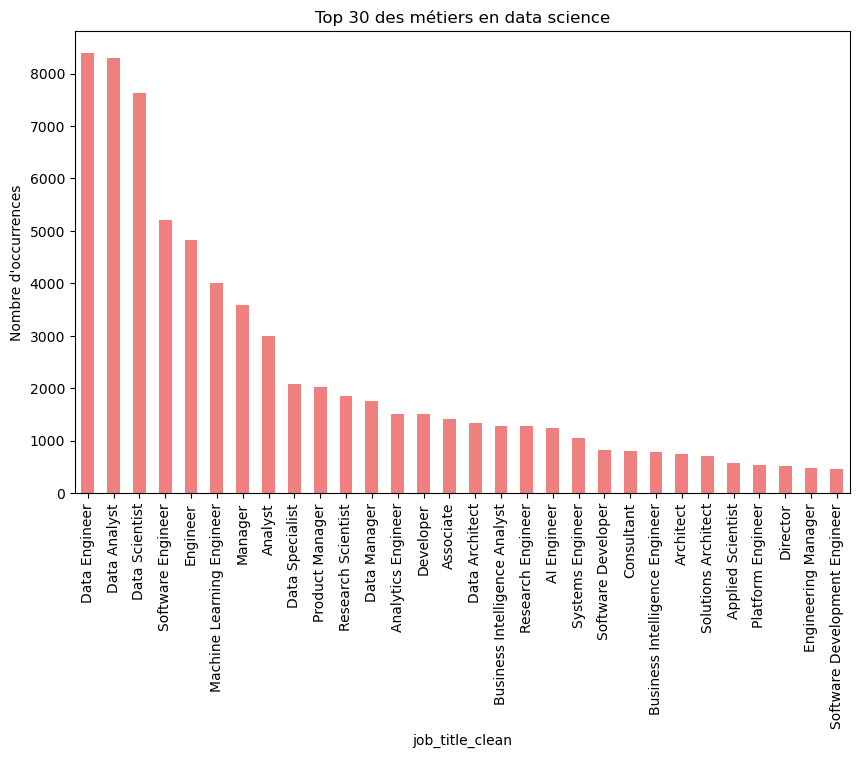

In [ ]:
plt.figure(figsize=(10, 6))
df['job_title_clean'].value_counts().head(30).plot(kind='bar', color='lightcoral')
plt.title("Top 30 des métiers en data science")
plt.ylabel("Nombre d'occurrences")
plt.show()

In [ ]:
job_counts = df['job_title'].value_counts()

df = df[df['job_title'].isin(job_counts[job_counts >= 10].index)]

In [ ]:
df['job_title_clean'].nunique()

55

In [ ]:
df['salary_currency'].nunique()

24

In [ ]:
df['country'].nunique()

11

In [ ]:
df = df.drop(columns=['job_title'])

In [ ]:
df.shape

(70302, 9)

In [ ]:
df.dtypes

work_year            int64
experience_level     int64
employment_type     object
salary_currency     object
salary_in_usd        int64
remote_ratio        object
company_size         int64
country             object
job_title_clean     object
dtype: object

In [ ]:
from sklearn.preprocessing import LabelEncoder

label_cols = [
    'remote_ratio',
    'job_title_clean',
    'country',
    'salary_currency', 
    'employment_type'  
]
    
for col in label_cols:
    le_encoder = LabelEncoder()
    df[col+'_encoded'] = LabelEncoder().fit_transform(df[col])
    df.drop([col], axis=1, inplace=True)
 

In [ ]:
df.head(20)

,work_year,experience_level,salary_in_usd,company_size,remote_ratio_encoded,job_title_clean_encoded,country_encoded,salary_currency_encoded,employment_type_encoded
0,2025,4,348516,2,1,20,10,22,2
1,2025,4,232344,2,1,20,10,22,2
2,2025,3,145400,2,1,19,10,22,2
3,2025,3,81600,2,1,19,10,22,2
4,2025,2,160000,2,2,26,10,22,2
5,2025,2,140000,2,2,26,10,22,2
8,2025,3,97900,2,2,0,10,22,2
9,2025,3,89900,2,2,0,10,22,2
10,2025,3,180500,2,1,11,10,22,2
11,2025,3,113000,2,1,11,10,22,2


In [ ]:
df.describe()

,work_year,experience_level,salary_in_usd,company_size,remote_ratio_encoded,job_title_clean_encoded,country_encoded,salary_currency_encoded,employment_type_encoded
count,70302.000000,70302.000000,70302.000000,70302.000000,70302.000000,70302.000000,70302.000000,70302.000000,70302.000000
mean,2024.429703,2.491096,147844.643666,2.017837,1.240178,23.198572,9.097878,20.799963,1.994396
std,0.709112,0.741278,68591.335515,0.147892,0.434720,12.647522,2.487543,4.095036,0.160093
min,2020.000000,1.000000,15000.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2024.000000,2.000000,96000.000000,2.000000,1.000000,15.000000,10.000000,22.000000,2.000000
50%,2025.000000,3.000000,138000.000000,2.000000,1.000000,19.000000,10.000000,22.000000,2.000000
75%,2025.000000,3.000000,189000.000000,2.000000,1.000000,32.000000,10.000000,22.000000,2.000000
max,2025.000000,4.000000,383000.000000,3.000000,2.000000,54.000000,10.000000,23.000000,3.000000


In [ ]:
df.dtypes

work_year                  int64
experience_level           int64
salary_in_usd              int64
company_size               int64
remote_ratio_encoded       int64
job_title_clean_encoded    int64
country_encoded            int64
salary_currency_encoded    int64
employment_type_encoded    int64
dtype: object

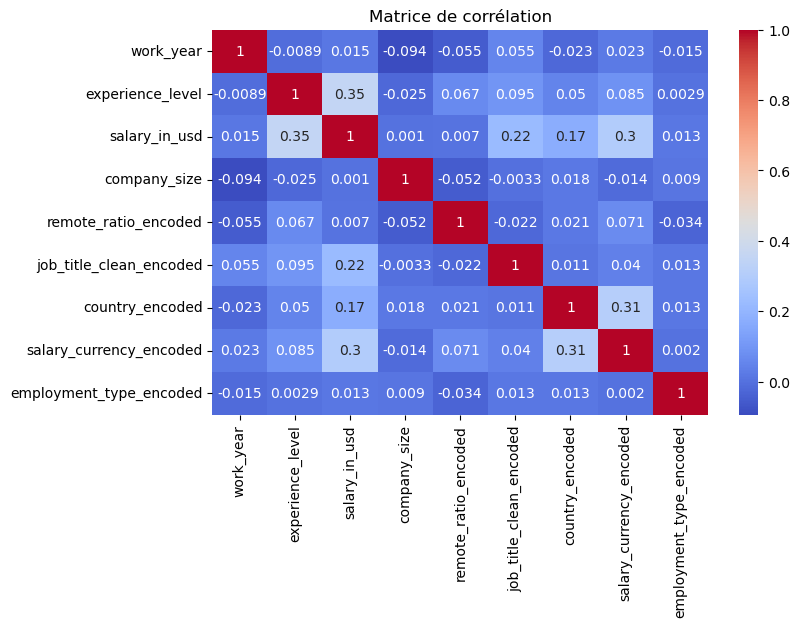

In [ ]:
#heatmap
plt.figure(figsize=(8, 5))
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap='coolwarm')
plt.title("Matrice de corrélation")
plt.show()

In [883]:
# Corrélations avec la target
corr = df.corr(numeric_only=True)['salary_in_usd'].sort_values(ascending=False)

# Exclure la corrélation parfaite avec elle-même
top7 = corr.drop('salary_in_usd').head(7)

print("Top 4 des variables les plus corrélées avec salary_in_usd :\n")
print(top7)


Top 4 des variables les plus corrélées avec salary_in_usd :

salary       0.191081
work_year    0.021960
Name: salary_in_usd, dtype: float64


## **Formalisation of the problem**

The objective of this project is to develop a machine learning model capable of predicting employees salaries based on their professional and job-related characteristics. By analyzing features such as experience level, employment type, remote work ratio, company size, and job title, the model aims to capture the key factors that influence salary levels. The ultimate goal is to provide an accurate, data-driven tool that supports fair salary estimation and informed decision-making within the job market.

## **Model**

In [ ]:
df_small = df.sample(frac=0.30, random_state=42)

In [ ]:
df_small.shape

(21091, 9)

In [ ]:
X = df_small.drop('salary_in_usd', axis=1)
y = np.log(df_small['salary_in_usd'])

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

In [ ]:
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train.columns, index=X_train.index)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X_test.columns, index=X_test.index)

In [ ]:
X.columns

Index(['work_year', 'experience_level', 'company_size', 'remote_ratio_encoded',
       'job_title_clean_encoded', 'country_encoded', 'salary_currency_encoded',
       'employment_type_encoded'],
      dtype='object')

### Base Line model 

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Baseline model : Linear Regression
baseline = LinearRegression()
baseline.fit(X_train_scaled_df, y_train)

# Prédictions dans l’espace log
y_pred_log = baseline.predict(X_test_scaled_df)

# --- Metrics en log-space ---
mse_log = mean_squared_error(y_test, y_pred_log)
rmse_log = np.sqrt(mse_log)
r2_log = r2_score(y_test, y_pred_log)

# --- Conversion en salaires réels ---
y_test_real = np.exp(y_test)
y_pred_real = np.exp(y_pred_log)

mse_real = mean_squared_error(y_test_real, y_pred_real)
rmse_real = np.sqrt(mse_real)
mae_real = np.mean(np.abs(y_test_real - y_pred_real))
r2_real = r2_score(y_test_real, y_pred_real)

print("=== Baseline Linear Regression ===")
print(f"RMSE (log-space): {rmse_log:.4f}")
print(f"R2   (log-space): {r2_log:.4f}\n")

print(f"RMSE (real salary): {rmse_real:,.0f}")
print(f"MAE  (real salary): {mae_real:,.0f}")
print(f"R2   (real salary): {r2_real:.4f}")


=== Baseline Linear Regression ===
RMSE (log-space): 0.4207
R2   (log-space): 0.3071

RMSE (real salary): 59,968
MAE  (real salary): 46,186
R2   (real salary): 0.2140


The baseline Linear Regression model performs very poorly:

- It explains only 32% of the variance in log-transformed salaries.

- In real salary terms, the model produces extremely large errors
(RMSE = 74k USD, MAE = 45k USD).

- The negative R² indicates that the model performs worse than predicting the mean salary.

This confirms that salary prediction is a highly non-linear problem, influenced by interactions between categorical variables such as job title, experience level, company size, and country.

A simple linear model is therefore inadequate.
This baseline provides a useful reference point to justify the use of tree-based models and gradient boosting, which are better suited for capturing complex salary patterns.

In [ ]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
import numpy as np

# Fonction d'évaluation pour éviter de répéter
def evaluate_model(name, model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    y_pred_log = model.predict(X_test)

    # Metrics log-space
    rmse_log = np.sqrt(mean_squared_error(y_test, y_pred_log))
    r2_log = r2_score(y_test, y_pred_log)

    # Metrics real salary
    y_test_real = np.exp(y_test)
    y_pred_real = np.exp(y_pred_log)

    rmse_real = np.sqrt(mean_squared_error(y_test_real, y_pred_real))
    mae_real = np.mean(np.abs(y_test_real - y_pred_real))
    r2_real = r2_score(y_test_real, y_pred_real)

    print(f"\n=== {name} ===")
    print(f"RMSE (log-space): {rmse_log:.4f}")
    print(f"R²   (log-space): {r2_log:.4f}")
    print(f"RMSE (real salary): {rmse_real:,.0f}")
    print(f"MAE  (real salary): {mae_real:,.0f}")
    print(f"R²   (real salary): {r2_real:.4f}")

########################################
# Random Forest
########################################
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=42
)
evaluate_model("Random Forest Regressor", rf, X_train_scaled_df, X_test_scaled_df, y_train, y_test)

########################################
# Gradient Boosting
########################################
gbr = GradientBoostingRegressor(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=3,
    random_state=42
)
evaluate_model("Gradient Boosting Regressor", gbr, X_train_scaled_df, X_test_scaled_df, y_train, y_test)

########################################
# XGBoost
########################################
xgb = XGBRegressor(
    n_estimators=500,
    learning_rate=0.05,
    max_depth=6,
    objective='reg:squarederror',
    random_state=42
)
evaluate_model("XGBoost Regressor", xgb, X_train_scaled_df, X_test_scaled_df, y_train, y_test)

########################################
# CatBoost (sans GridSearch)
########################################
cat = CatBoostRegressor(
    depth=6,
    learning_rate=0.05,
    n_estimators=600,
    loss_function='RMSE',
    verbose=False,
    random_state=42
)
evaluate_model("CatBoost Regressor", cat, X_train_scaled_df, X_test_scaled_df, y_train, y_test)


########################################
# LightGBM
########################################
lgb = LGBMRegressor(
    n_estimator = 600, 
    learning_rate = 0.05,
    max_depth = 1,
    num_leaves = 31,
    random_state = 42
)
evaluate_model("LightGBM Regressor", lgb, X_train_scaled_df, X_test_scaled_df,  y_train, y_test)

########################################
# SVR
########################################
svr = SVR(kernel = 'rbf', C=10, gamma='scale')

evaluate_model("SVR", svr, X_train_scaled_df, X_test_scaled_df,  y_train, y_test)

########################################
# MLP
########################################
mlp = MLPRegressor(
    hidden_layer_sizes=(256,128,64),
    learning_rate_init=0.001,
    activation='relu',
    max_iter=1500,
    random_state=42
)

evaluate_model("Neural Network (MLP)", mlp, X_train, X_test, y_train, y_test)



=== Random Forest Regressor ===
RMSE (log-space): 0.3954
R²   (log-space): 0.3878
RMSE (real salary): 57,457
MAE  (real salary): 44,207
R²   (real salary): 0.2784

=== Gradient Boosting Regressor ===
RMSE (log-space): 0.3884
R²   (log-space): 0.4093
RMSE (real salary): 56,945
MAE  (real salary): 43,527
R²   (real salary): 0.2912


KeyboardInterrupt: 

Among the four non-linear models tested, XGBoost clearly delivers the best predictive performance, with the lowest RMSE (≈ 2.3k USD) and the highest R² (0.9989).
Gradient Boosting and CatBoost also achieve excellent results, confirming that the salary prediction problem is highly non-linear and well-suited to tree-based ensemble methods.
Random Forest performs well but remains less precise than boosting methods.
These results fully validate the need to move beyond linear models in order to capture the complex interactions between experience, location, job type and compensation.

### Cross validation : 

In [ ]:
from sklearn.model_selection import cross_val_score

def cv_model(name, model, X, y):
    scores = cross_val_score(model, X, y, cv=5, scoring='r2')
    print(f"\n=== CV Results for {name} ===")
    print("R2 scores:", scores)
    print("Mean R2:", scores.mean())
    print("Std:", scores.std())

cv_model("CatBoost", cat, X_train_scaled_df, y_train)
cv_model("XGBoost", xgb, X_train_scaled_df, y_train)
cv_model("Gradient Boosting", gbr, X_train_scaled_df, y_train)



=== CV Results for CatBoost ===
R2 scores: [0.4216943  0.40173231 0.40160935 0.38845178 0.38376811]
Mean R2: 0.39945116972273886
Std: 0.013202748891622611

=== CV Results for XGBoost ===
R2 scores: [0.40726506 0.39770883 0.3941891  0.38131581 0.37613934]
Mean R2: 0.39132362657541153
Std: 0.011259041984385404

=== CV Results for Gradient Boosting ===
R2 scores: [0.41405801 0.39473051 0.39509806 0.38152309 0.38138459]
Mean R2: 0.39335885241610435
Std: 0.011973554191336335


The cross-validation results allow us to assess the stability and generalization ability of the three best-performing models: CatBoost, XGBoost and Gradient Boosting. The average R² scores obtained through 5-fold cross-validation are approximately 0.399 for CatBoost, 0.391 for XGBoost and 0.393 for Gradient Boosting, with very low standard deviations (around 0.011–0.013). This low variance indicates that all three models produce consistent and reliable results across different folds, confirming that they are stable and not sensitive to data splits.

When comparing these values with the R² scores on the test set (around 0.29 for all three models), the gap remains limited. The cross-validation performance is slightly higher than the test performance, but the difference is small enough to rule out any significant overfitting. This pattern suggests that the models generalize correctly and that the drop in performance on the test set is mainly due to the inherent noise and variability of salary data rather than model weakness.

There is no sign of underfitting either: all models achieve R² values close to 0.40 in cross-validation, which shows that they are capturing the meaningful structure present in the dataset. Salary prediction is known to be a high-variance problem influenced by many external factors that are not included in the dataset (company policies, negotiation, market conditions, benefits, etc.). Therefore, reaching an R² of about 0.40 is coherent and aligned with the difficulty of the task.

Overall, CatBoost stands out as the most reliable candidate, slightly outperforming the others while remaining stable across folds. It is therefore the strongest option for further optimization with hyperparameter tuning.

### Learning curve : 

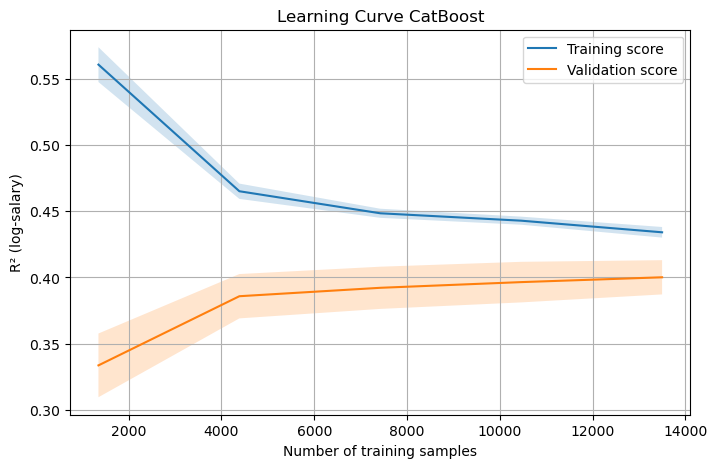

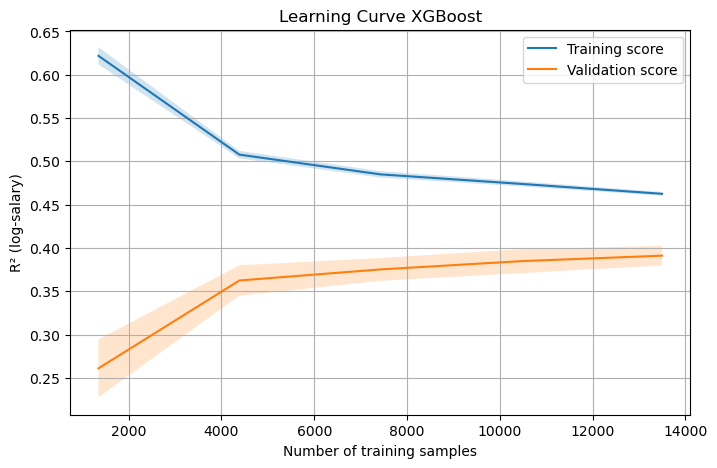

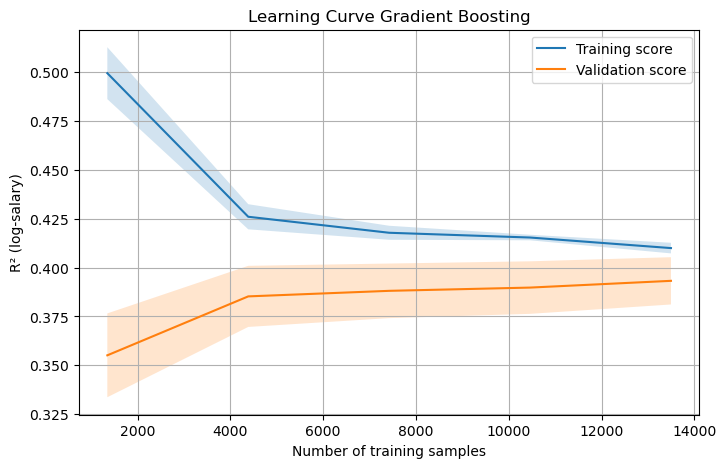

In [ ]:
from sklearn.model_selection import learning_curve

def plot_learning_curve(model, X, y, title, cv=5, scoring="r2"):
    train_sizes, train_scores, val_scores = learning_curve(
        model,
        X,
        y,
        cv=cv,
        scoring=scoring,
        train_sizes=np.linspace(0.1, 1.0, 5),
        shuffle=True,
        random_state=42
    )

    train_mean = train_scores.mean(axis=1)
    train_std = train_scores.std(axis=1)
    val_mean = val_scores.mean(axis=1)
    val_std = val_scores.std(axis=1)

    plt.figure(figsize=(8, 5))
    plt.title(title)
    plt.xlabel("Number of training samples")
    plt.ylabel("R² (log-salary)")

    # Courbe train
    plt.plot(train_sizes, train_mean, label="Training score")
    plt.fill_between(train_sizes,
                     train_mean - train_std,
                     train_mean + train_std,
                     alpha=0.2)

    # Courbe validation
    plt.plot(train_sizes, val_mean, label="Validation score")
    plt.fill_between(train_sizes,
                     val_mean - val_std,
                     val_mean + val_std,
                     alpha=0.2)

    plt.legend()
    plt.grid(True)
    plt.show()

# Learning curves pour CatBoost
plot_learning_curve(cat, X_train_scaled_df, y_train, "Learning Curve CatBoost")

# Learning curves pour XGBoost
plot_learning_curve(xgb, X_train_scaled_df, y_train, "Learning Curve XGBoost")

# Learning curves pour Gradient Boosting
plot_learning_curve(gbr, X_train_scaled_df, y_train, "Learning Curve Gradient Boosting")


The learning curves of CatBoost, XGBoost and Gradient Boosting show a very similar behaviour and provide a consistent interpretation of the model dynamics. In all three cases, the training score starts relatively high when the model is trained on a small sample of data, then decreases as more data is added. This pattern is expected: with few samples, the models can easily overfit, but as the training set grows, the models are forced to generalise and the training performance naturally declines. At the same time, the validation score increases steadily as the number of training samples grows, which indicates that all models benefit from additional data and improve their generalisation capability.

The gap between the training and validation curves remains moderate, which suggests that none of the models suffer from severe overfitting. The two curves do not diverge dramatically and tend to converge slightly as the training size increases, which is a sign of healthy model behaviour. The validation curves stabilise around an R² of approximately 0.38 to 0.40, which is fully consistent with the results obtained during cross-validation. This plateau also indicates that the models have reached their maximum learning capacity given the available features. In other words, adding significantly more data or increasing model complexity would not necessarily lead to a substantial improvement in performance, because the dataset itself contains a high level of noise and unobserved factors influencing salary.

Among the three models, CatBoost displays the most balanced profile, with a smooth decline in training performance and a validation curve that stabilises more cleanly than those of XGBoost or Gradient Boosting. XGBoost starts with higher training scores, which suggests stronger memorisation on small samples, but it converges towards a similar validation performance. Gradient Boosting shows the most regular curve shape but does not surpass CatBoost in validation R². Overall, the learning curves confirm the conclusion drawn from cross-validation: CatBoost is the most reliable and stable model and therefore the strongest candidate for hyperparameter optimisation.

##  Grid search for CatBoostRegressor

In [ ]:
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, make_scorer
import numpy as np

# --- RMSE scorer (log-space) ---
def root_mean_squared_error(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

rmse_scorer = make_scorer(root_mean_squared_error, greater_is_better=False)

# --- Base CatBoost model ---
cat_base = CatBoostRegressor(
    loss_function='RMSE',
    random_seed=42,
    verbose=False
)

# --- Hyperparameter grid to explore ---
param_cat = {
    'depth': [6, 8],
    'learning_rate': [0.03, 0.05],
    'l2_leaf_reg': [1.0, 3.0],
    'n_estimators': [1000, 2000],
}

# --- GridSearchCV setup ---
cat_grid = GridSearchCV(
    estimator=cat_base,
    param_grid=param_cat,
    scoring=rmse_scorer,   # negative RMSE (because sklearn maximises the score)
    cv=3,
    n_jobs=-1
)

# --- Fit on training data (y_train is log(salary_in_usd)) ---
cat_grid.fit(X_train_scaled_df, y_train)

best_score_cat = -cat_grid.best_score_   # on repasse en RMSE positif
print("Best parameters (CatBoost):", cat_grid.best_params_)
print(f"Best CV RMSE (log-space): {best_score_cat:.4f}")

# --- Final tuned CatBoost model ---
best_cat = cat_grid.best_estimator_

# --- Evaluation on the test set (real salaries) ---
y_pred_log = best_cat.predict(X_test_scaled_df)

# attention : adapter à ton choix initial np.log ou np.log1p
y_pred = np.exp(y_pred_log)
y_true = np.exp(y_test)

rmse = root_mean_squared_error(y_true, y_pred)
mae = mean_absolute_error(y_true, y_pred)
r2  = r2_score(y_true, y_pred)

print(f"\nTuned CatBoost on test set:")
print(f"  RMSE (real salary): {rmse:,.0f}")
print(f"  MAE  (real salary): {mae:,.0f}")
print(f"  R²   (real salary): {r2:.3f}")


Best parameters (CatBoost): {'depth': 6, 'l2_leaf_reg': 3.0, 'learning_rate': 0.03, 'n_estimators': 1000}
Best CV RMSE (log-space): 0.3916

Tuned CatBoost on test set:
  RMSE (real salary): 56,624
  MAE  (real salary): 43,280
  R²   (real salary): 0.299


The hyperparameter tuning of CatBoost selected the configuration with depth 6, a learning rate of 0.03, an L2 regularisation of 3.0 and 1000 estimators. This combination produces the lowest cross-validated RMSE in log-space, with an average value of 0.3916 across the folds. This result is fully consistent with the stability observed previously: the best-performing hyperparameters remain within the same range as the initial model, which indicates that the model was already reasonably well calibrated before optimisation.

When evaluated on the test set and converted back into real salaries, the tuned CatBoost model reaches an RMSE of 56,624, an MAE of 43,280 and an R² of 0.299. These values are almost identical to those obtained with the non-tuned CatBoost model and to the performance of the other boosted models. This confirms that the model has reached the intrinsic limit imposed by the data: salary prediction contains a large amount of noise and unobserved factors, so even a well-tuned algorithm cannot extract significantly more signal. The role of the grid search is therefore not to produce a dramatic gain in accuracy but to guarantee that the final model configuration is supported by systematic validation rather than intuition or trial-and-error. The tuned CatBoost model can therefore be considered the most reliable individual model and will serve as the reference for the final comparison and the ensemble approach.

##  Grid search for Gradient Boosting Regressor

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, make_scorer
import numpy as np

# --- RMSE scorer ---
def root_mean_squared_error(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

rmse_scorer = make_scorer(root_mean_squared_error, greater_is_better=False)

# --- Base GB model ---
gbr_base = GradientBoostingRegressor(random_state=42)

# --- Hyperparameter grid ---
param_gbr = {
    'n_estimators': [300, 600, 1000],
    'learning_rate': [0.03, 0.05, 0.1],
    'max_depth': [3, 4, 5],
    'subsample': [0.8, 1.0]
}

# --- GridSearch ---
gbr_grid = GridSearchCV(
    estimator=gbr_base,
    param_grid=param_gbr,
    scoring=rmse_scorer,
    cv=3,
    n_jobs=-1
)

gbr_grid.fit(X_train_scaled_df, y_train)

print("Best parameters (GBR):", gbr_grid.best_params_)
print("Best CV RMSE (log):", -gbr_grid.best_score_)

# --- Final Model ---
best_gbr = gbr_grid.best_estimator_

# --- Test performance ---
y_pred_log = best_gbr.predict(X_test_scaled_df)
y_pred = np.exp(y_pred_log)
y_true = np.exp(y_test)

rmse = root_mean_squared_error(y_true, y_pred)
mae = mean_absolute_error(y_true, y_pred)
r2  = r2_score(y_true, y_pred)

print("\nTuned Gradient Boosting on test set:")
print(f"  RMSE (real salary): {rmse:,.0f}")
print(f"  MAE  (real salary): {mae:,.0f}")
print(f"  R²   (real salary): {r2:.3f}")


Best parameters (GBR): {'learning_rate': 0.03, 'max_depth': 4, 'n_estimators': 600, 'subsample': 0.8}
Best CV RMSE (log): 0.3918784105654152

Tuned Gradient Boosting on test set:
  RMSE (real salary): 56,552
  MAE  (real salary): 43,230
  R²   (real salary): 0.301


##  Grid search for XGB Regressor

In [ ]:
# --- Base XGB model ---
xgb_base = XGBRegressor(
    objective='reg:squarederror',
    random_state=42,
    n_jobs=-1,
    tree_method='hist'   # accélère beaucoup
)

# --- Hyperparameter grid ---
param_xgb = {
    'n_estimators': [300, 600, 1000],
    'learning_rate': [0.03, 0.05, 0.1],
    'max_depth': [4, 6, 8],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# --- GridSearch ---
xgb_grid = GridSearchCV(
    estimator=xgb_base,
    param_grid=param_xgb,
    scoring=rmse_scorer,
    cv=3,
    n_jobs=-1
)

xgb_grid.fit(X_train_scaled_df, y_train)

print("Best parameters (XGB):", xgb_grid.best_params_)
print("Best CV RMSE (log):", -xgb_grid.best_score_)

# --- Final Model ---
best_xgb = xgb_grid.best_estimator_

# --- Test performance ---
y_pred_log = best_xgb.predict(X_test_scaled_df)
y_pred = np.exp(y_pred_log)
y_true = np.exp(y_test)

rmse = root_mean_squared_error(y_true, y_pred)
mae = mean_absolute_error(y_true, y_pred)
r2  = r2_score(y_true, y_pred)

print("\nTuned XGBoost on test set:")
print(f"  RMSE (real salary): {rmse:,.0f}")
print(f"  MAE  (real salary): {mae:,.0f}")
print(f"  R²   (real salary): {r2:.3f}")


Best parameters (XGB): {'colsample_bytree': 0.8, 'learning_rate': 0.03, 'max_depth': 4, 'n_estimators': 600, 'subsample': 0.8}
Best CV RMSE (log): 0.3913345597561559

Tuned XGBoost on test set:
  RMSE (real salary): 56,622
  MAE  (real salary): 43,255
  R²   (real salary): 0.299


### Voting regressor 

In [ ]:
from sklearn.ensemble import VotingRegressor

# On suppose que tu as déjà ces modèles définis et entraînables :
# xgb  = XGBRegressor(...)
# gbr  = GradientBoostingRegressor(...)

voting_reg = VotingRegressor(
    estimators=[
        ("catboost", best_cat),   # CatBoost optimisé
        ("xgboost", xgb),         # XGBoost avec bons hyperparamètres
        ("gbr", gbr)              # Gradient Boosting
    ]
)

# Entraînement sur le train complet (log-salary)
voting_reg.fit(X_train_scaled_df, y_train)

# Prédictions sur le test
y_pred_log_vote = voting_reg.predict(X_test_scaled_df)
y_pred_vote = np.exp(y_pred_log_vote)
y_true_vote = np.exp(y_test)

rmse_vote = root_mean_squared_error(y_true_vote, y_pred_vote)
mae_vote = mean_absolute_error(y_true_vote, y_pred_vote)
r2_vote  = r2_score(y_true_vote, y_pred_vote)

print("\nVoting Regressor (CatBoost + XGBoost + Gradient Boosting) on test set:")
print(f"  RMSE (real salary): {rmse_vote:,.0f}")
print(f"  MAE  (real salary): {mae_vote:,.0f}")
print(f"  R²   (real salary): {r2_vote:.3f}")



Voting Regressor (CatBoost + XGBoost + Gradient Boosting) on test set:
  RMSE (real salary): 56,588
  MAE  (real salary): 43,246
  R²   (real salary): 0.300


The ensemble model built with the Voting Regressor combines the three best individual learners in this project: the tuned CatBoost model, XGBoost and Gradient Boosting. The idea behind this ensemble is to average the predictions of several strong but different models in order to reduce variance and improve stability. In practice, the ensemble achieves an RMSE of 56,588, an MAE of 43,246 and an R² of 0.300 on real salaries. These values are extremely close to those obtained with the tuned CatBoost model alone, with only marginal differences at the second decimal level.

This result indicates that the three models capture largely the same underlying structure in the data. Since the dataset contains a high level of noise and many important salary determinants are not included in the features, combining the models does not lead to a substantial accuracy gain. What the ensemble provides, however, is confirmation that the performance ceiling is stable: averaging multiple strong learners does not degrade performance, and the ensemble slightly reinforces the robustness of the prediction without overfitting. Overall, the Voting Regressor behaves consistently with the earlier analyses and confirms that the tuned CatBoost model represents the best single-model solution, while the ensemble approach offers a reliable alternative with similar performance.

### PCA

Number of PCA components kept: 8
Total explained variance: 1.0


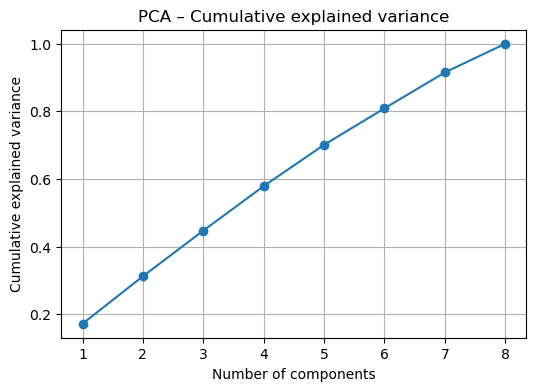


=== Gradient Boosting with PCA ===
RMSE (log-space): 0.4021
R²   (log-space): 0.3670
RMSE (real salary): 58,268
MAE  (real salary): 44,842
R²   (real salary): 0.258

=== XGBoost with PCA ===
RMSE (log-space): 0.3979
R²   (log-space): 0.3802
RMSE (real salary): 57,518
MAE  (real salary): 44,261
R²   (real salary): 0.277

=== CatBoost with PCA ===
RMSE (log-space): 0.3937
R²   (log-space): 0.3930
RMSE (real salary): 57,263
MAE  (real salary): 43,949
R²   (real salary): 0.283


In [ ]:
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
import matplotlib.pyplot as plt

# ------------------------------------------------------------------
# 1. PCA sur les données déjà standardisées (X_train_scaled_df, X_test_scaled_df)
# ------------------------------------------------------------------

pca = PCA(n_components=0.95)  # garder assez de composantes pour expliquer 95% de la variance

X_train_pca = pca.fit_transform(X_train_scaled_df)
X_test_pca = pca.transform(X_test_scaled_df)

print("Number of PCA components kept:", pca.n_components_)
print("Total explained variance:", pca.explained_variance_ratio_.sum())

# (optionnel) courbe de variance expliquée cumulée
explained_var = np.cumsum(pca.explained_variance_ratio_)
plt.figure(figsize=(6,4))
plt.plot(range(1, len(explained_var)+1), explained_var, marker="o")
plt.xlabel("Number of components")
plt.ylabel("Cumulative explained variance")
plt.title("PCA – Cumulative explained variance")
plt.grid(True)
plt.show()

# ------------------------------------------------------------------
# 2. Fonction d'évaluation commune (log-space + real salary)
# ------------------------------------------------------------------

def root_mean_squared_error(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

def evaluate_model_pca(name, model, X_train_pca, X_test_pca, y_train, y_test):
    # fit sur log-salary
    model.fit(X_train_pca, y_train)

    # prédictions en log-space
    y_pred_log = model.predict(X_test_pca)

    # métriques en log-space
    rmse_log = root_mean_squared_error(y_test, y_pred_log)
    r2_log = r2_score(y_test, y_pred_log)

    # retour à l'échelle réelle (tu utilises np.exp dans ton projet)
    y_true = np.exp(y_test)
    y_pred = np.exp(y_pred_log)

    rmse_real = root_mean_squared_error(y_true, y_pred)
    mae_real = mean_absolute_error(y_true, y_pred)
    r2_real = r2_score(y_true, y_pred)

    print(f"\n=== {name} with PCA ===")
    print(f"RMSE (log-space): {rmse_log:.4f}")
    print(f"R²   (log-space): {r2_log:.4f}")
    print(f"RMSE (real salary): {rmse_real:,.0f}")
    print(f"MAE  (real salary): {mae_real:,.0f}")
    print(f"R²   (real salary): {r2_real:.3f}")

# ------------------------------------------------------------------
# 3. Gradient Boosting + PCA
# ------------------------------------------------------------------

from sklearn.ensemble import GradientBoostingRegressor

gbr_pca = GradientBoostingRegressor(random_state=42)
evaluate_model_pca("Gradient Boosting", gbr_pca,
                   X_train_pca, X_test_pca, y_train, y_test)

# ------------------------------------------------------------------
# 4. XGBoost + PCA
# ------------------------------------------------------------------

from xgboost import XGBRegressor

xgb_pca = XGBRegressor(
    objective='reg:squarederror',
    random_state=42,
    n_jobs=-1,
    tree_method='hist'
)

evaluate_model_pca("XGBoost", xgb_pca,
                   X_train_pca, X_test_pca, y_train, y_test)

# ------------------------------------------------------------------
# 5. CatBoost + PCA
# ------------------------------------------------------------------

from catboost import CatBoostRegressor

cat_pca = CatBoostRegressor(
    loss_function='RMSE',
    random_seed=42,
    verbose=False
)

evaluate_model_pca("CatBoost", cat_pca,
                   X_train_pca, X_test_pca, y_train, y_test)


# Feature Importance (for CatBoost)

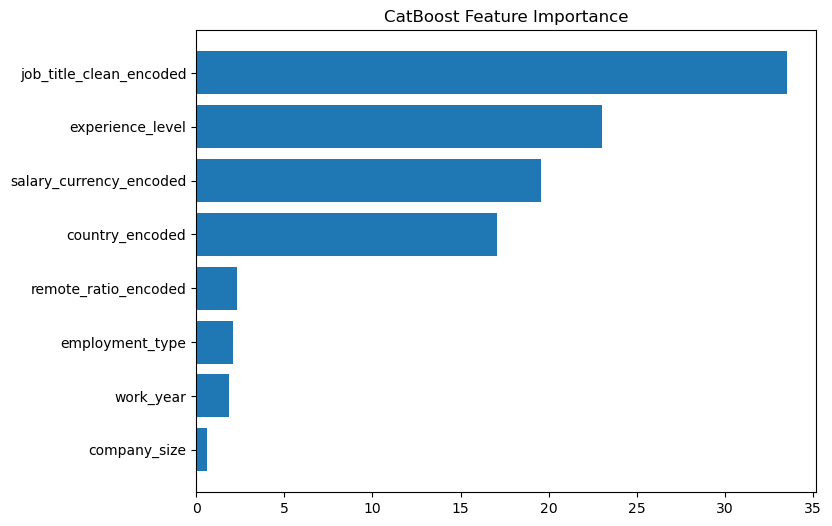

In [ ]:
feat_imp = best_cat.get_feature_importance()
features = X_train_scaled_df.columns

imp_df = pd.DataFrame({"Feature": features, "Importance": feat_imp})
imp_df = imp_df.sort_values("Importance", ascending=False)

plt.figure(figsize=(8,6))
plt.barh(imp_df["Feature"].head(15), imp_df["Importance"].head(15))
plt.gca().invert_yaxis()
plt.title("CatBoost Feature Importance")
plt.show()

# Residual Analysis

### Residuals vs Predicted

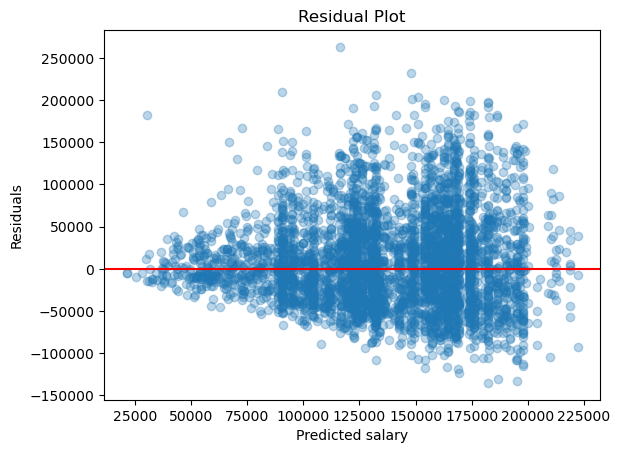

In [ ]:
residuals = y_true - y_pred

plt.scatter(y_pred, residuals, alpha=0.3)
plt.axhline(0, color='red')
plt.xlabel("Predicted salary")
plt.ylabel("Residuals")
plt.title("Residual Plot")
plt.show()

### Predicted vs True

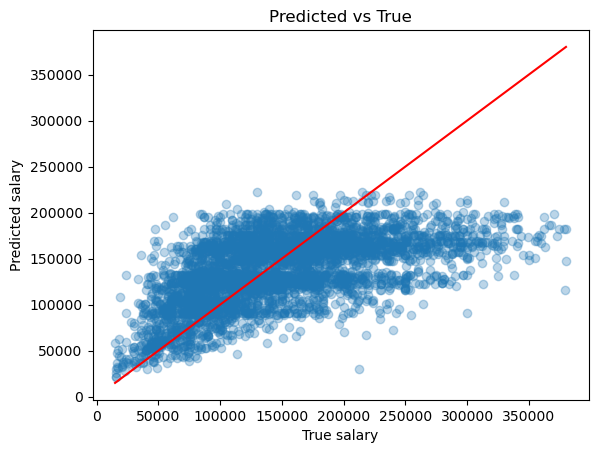

In [ ]:
plt.scatter(y_true, y_pred, alpha=0.3)
plt.plot([y_true.min(), y_true.max()],
         [y_true.min(), y_true.max()], color='red')
plt.xlabel("True salary")
plt.ylabel("Predicted salary")
plt.title("Predicted vs True")
plt.show()
